In [1]:
!pip install patchify
!pip install keras
!pip install opencv-python
!pip install matplotlib
!pip install seaborn
!pip install sklearn
!pip install scikit-learn
!pip install tensorflow
!pip install pandas
!pip install scikit-image

In [2]:
import os as os
import pandas as pd
import cv2 as cv2
import matplotlib.pyplot as plt
from patchify import patchify, unpatchify
import seaborn as sns
import random
import numpy as np
import math
from sklearn.model_selection import train_test_split
import pickle
import tensorflow as tf
from tensorflow.keras.callbacks import LearningRateScheduler,ReduceLROnPlateau
from tensorflow.keras import models, layers
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, BatchNormalization, Activation, Flatten, Dense, Input, MaxPooling2D, Add, Reshape, concatenate, AveragePooling2D, Multiply, GlobalAveragePooling2D, UpSampling2D, MaxPool2D,Softmax
from tensorflow.keras.activations import softmax
from tensorflow.keras import initializers, regularizers
from tensorflow.keras.optimizers import Adam
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
%load_ext tensorboard

In [3]:
path =r"D:\SIDD_Small_sRGB_Only\Data"
dir =os.listdir(path)
folders=[]
for folder in dir:
  folders.append(folder)
print(folders)
print(len(folders))
GT = []
Noisy = []
for folder in folders:
  files = os.listdir(path+'/'+folder)
  for img in files:
    #print(img)
    if img[5]=='G':
      GT.append(path+'/'+folder+'/'+img)
    elif img[0]=='N':
      Noisy.append(path+'/'+folder+'/'+img)
#print("GT:", GT)
#print("Noisy:", Noisy)

['0001_001_S6_00100_00060_3200_L', '0002_001_S6_00100_00020_3200_N', '0003_001_S6_00100_00060_3200_H', '0004_001_S6_00100_00060_4400_L', '0005_001_S6_00100_00060_4400_N', '0006_001_S6_00100_00060_4400_H', '0007_001_S6_00100_00100_5500_L', '0008_001_S6_00100_00100_5500_N', '0010_001_S6_00800_00350_3200_N', '0011_001_S6_00800_00500_5500_L', '0012_001_S6_00800_00500_5500_N', '0013_001_S6_03200_01250_3200_L', '0014_001_S6_03200_01250_3200_N', '0015_001_S6_03200_01600_5500_L', '0016_001_S6_03200_01600_5500_N', '0017_001_GP_00100_00060_5500_N', '0018_001_GP_00100_00160_5500_L', '0019_001_GP_00800_00640_5500_L', '0020_001_GP_00800_00350_5500_N', '0022_001_N6_00100_00060_5500_N', '0023_001_N6_00800_00350_5500_N', '0025_001_G4_00100_00060_5500_L', '0027_001_G4_00800_00350_5500_L', '0028_001_IP_00100_00160_5500_N', '0029_001_IP_00800_01000_5500_N', '0030_001_IP_01600_02000_5500_N', '0032_001_IP_00800_01000_3200_N', '0033_001_IP_00100_00160_3200_N', '0034_002_GP_00100_00160_3200_N', '0035_002_GP_

In [4]:
df = pd.DataFrame()
df['Ground Truth Images'] = GT
df['Noisy Images'] = Noisy
df.head()

,Ground Truth Images,Noisy Images
0,D:\SIDD_Small_sRGB_Only\Data/0001_001_S6_00100...,D:\SIDD_Small_sRGB_Only\Data/0001_001_S6_00100...
1,D:\SIDD_Small_sRGB_Only\Data/0002_001_S6_00100...,D:\SIDD_Small_sRGB_Only\Data/0002_001_S6_00100...
2,D:\SIDD_Small_sRGB_Only\Data/0003_001_S6_00100...,D:\SIDD_Small_sRGB_Only\Data/0003_001_S6_00100...
3,D:\SIDD_Small_sRGB_Only\Data/0004_001_S6_00100...,D:\SIDD_Small_sRGB_Only\Data/0004_001_S6_00100...
4,D:\SIDD_Small_sRGB_Only\Data/0005_001_S6_00100...,D:\SIDD_Small_sRGB_Only\Data/0005_001_S6_00100...


In [5]:
df.shape

(160, 2)

In [6]:
size=[]
print(len(df))
for i in range(len(df)):
  img_gt = cv2.imread(df['Ground Truth Images'].iloc[i])
  size.append(img_gt.shape)
df['image size'] = size
df['image size'] = df['image size'].astype(str)
df.head()

160


,Ground Truth Images,Noisy Images,image size
0,D:\SIDD_Small_sRGB_Only\Data/0001_001_S6_00100...,D:\SIDD_Small_sRGB_Only\Data/0001_001_S6_00100...,"(3000, 5328, 3)"
1,D:\SIDD_Small_sRGB_Only\Data/0002_001_S6_00100...,D:\SIDD_Small_sRGB_Only\Data/0002_001_S6_00100...,"(3000, 5328, 3)"
2,D:\SIDD_Small_sRGB_Only\Data/0003_001_S6_00100...,D:\SIDD_Small_sRGB_Only\Data/0003_001_S6_00100...,"(3000, 5328, 3)"
3,D:\SIDD_Small_sRGB_Only\Data/0004_001_S6_00100...,D:\SIDD_Small_sRGB_Only\Data/0004_001_S6_00100...,"(3000, 5328, 3)"
4,D:\SIDD_Small_sRGB_Only\Data/0005_001_S6_00100...,D:\SIDD_Small_sRGB_Only\Data/0005_001_S6_00100...,"(3000, 5328, 3)"


Text(0, 0.5, 'No. of images')

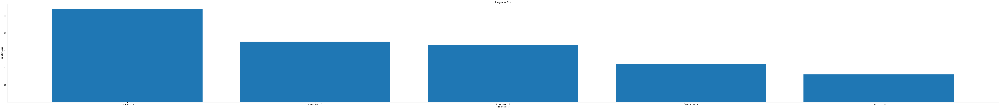

In [7]:
fig = plt.figure(figsize = (100, 10))
y = list(df['image size'].value_counts())
x = df['image size'].value_counts().index.tolist()
plt.bar(x,y)
plt.title("Images vs Size")
plt.xlabel("Size of images")
plt.ylabel("No. of images")
     

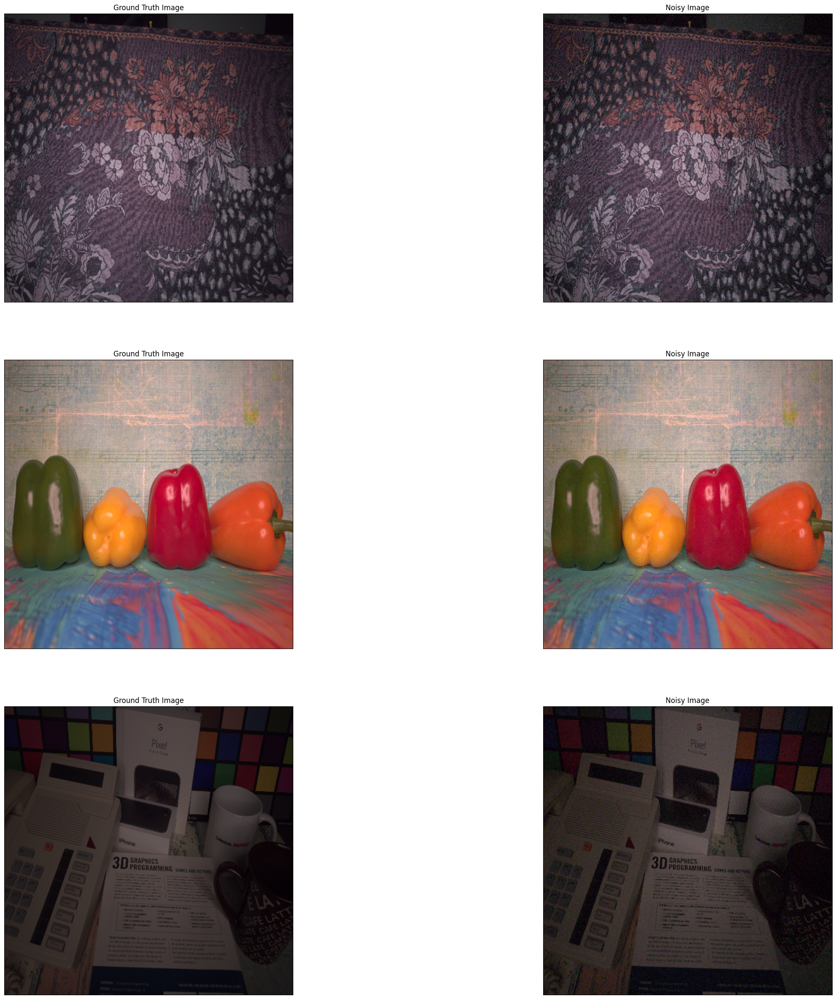

In [8]:
sample=df.sample(3)
fig, ax = plt.subplots(len(sample),2,figsize=(30,30))
for i in range(len(sample)):
  img = cv2.imread(sample['Ground Truth Images'].iloc[i])
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img = cv2.resize(img,(512,512))
  ax[i][0].imshow(img)
  ax[i][0].get_xaxis().set_visible(False)
  ax[i][0].get_yaxis().set_visible(False)
  ax[i][0].title.set_text("Ground Truth Image")
  
  img = cv2.imread(sample['Noisy Images'].iloc[i])
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img = cv2.resize(img,(512,512))
  ax[i][1].imshow(img)
  ax[i][1].get_xaxis().set_visible(False)
  ax[i][1].get_yaxis().set_visible(False)
  ax[i][1].title.set_text("Noisy Image")

In [9]:
X = df['Noisy Images']
y = df['Ground Truth Images']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

In [10]:
#Storing the image patches as pickle files
import pickle
pickle.dump((X_train,y_train),open('train_path.pkl','wb'))
pickle.dump((X_test,y_test),open('test_path.pkl','wb'))

In [11]:
X_train, y_train = pickle.load(open('train_path.pkl', 'rb'))
X_test,y_test = pickle.load(open('test_path.pkl', 'rb'))

In [12]:

print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)
     

(128,)
(128,)
(32,)
(32,)


In [13]:
def patches(img,patch_size):
  patches = patchify(img, (patch_size, patch_size, 3), step=patch_size)
  return patches

In [14]:

sample = pd.DataFrame({'Ground Truth Images':['a','D:/SIDD_Small_sRGB_Only/Data/0120_006_N6_01600_00400_3200_L/GT_SRGB_010.PNG'], 'Noisy Images':['b',"D:/SIDD_Small_sRGB_Only/Data/0120_006_N6_01600_00400_3200_L/NOISY_SRGB_010.PNG"]})
sample

,Ground Truth Images,Noisy Images
0,a,b
1,D:/SIDD_Small_sRGB_Only/Data/0120_006_N6_01600...,D:/SIDD_Small_sRGB_Only/Data/0120_006_N6_01600...


In [15]:

#Creating patches for a Ground Truth Image
path = sample['Ground Truth Images'].iloc[1]
img = cv2.imread(path)
print(path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
print('Image shape: {}'.format(img.shape))

patches_gt = patches(img,256)
print('Patch shape: {}'.format(patches_gt.shape))

D:/SIDD_Small_sRGB_Only/Data/0120_006_N6_01600_00400_3200_L/GT_SRGB_010.PNG
Image shape: (3120, 4208, 3)
Patch shape: (12, 16, 1, 256, 256, 3)


In [16]:
#Creating patches for a Noisy Image
path = sample['Noisy Images'].iloc[1]
img = cv2.imread(path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
print('Image shape: {}'.format(img.shape))

patches_nsy = patches(img,256)
print('Patch shape: {}'.format(patches_nsy.shape))

Image shape: (3120, 4208, 3)
Patch shape: (12, 16, 1, 256, 256, 3)


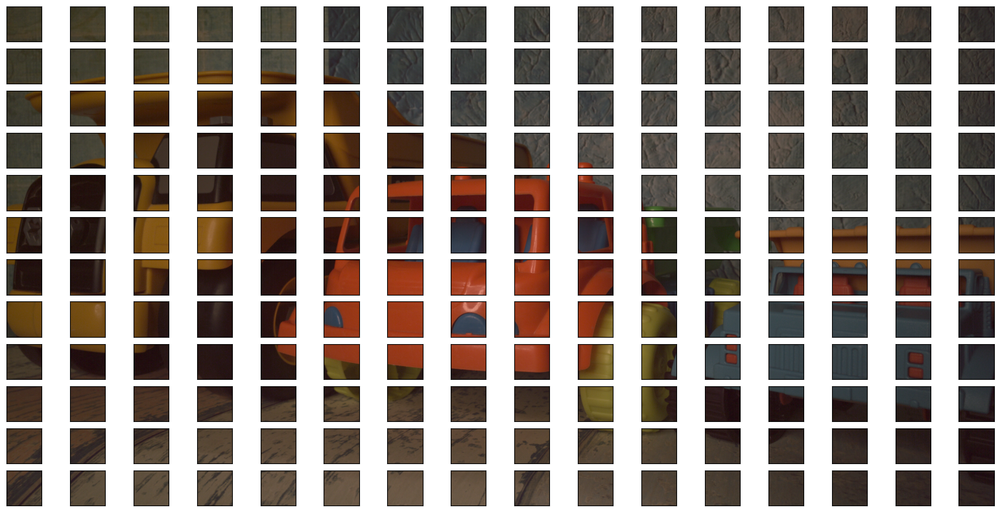

In [17]:

rows = patches_nsy.shape[0]
cols = patches_nsy.shape[1]
fig, axs = plt.subplots(rows,cols,figsize=(20,10))
for i in range(rows):
  for j in range(cols):
    axs[i][j].imshow(patches_gt[i][j][0])
    axs[i][j].get_xaxis().set_visible(False)
    axs[i][j].get_yaxis().set_visible(False)
     

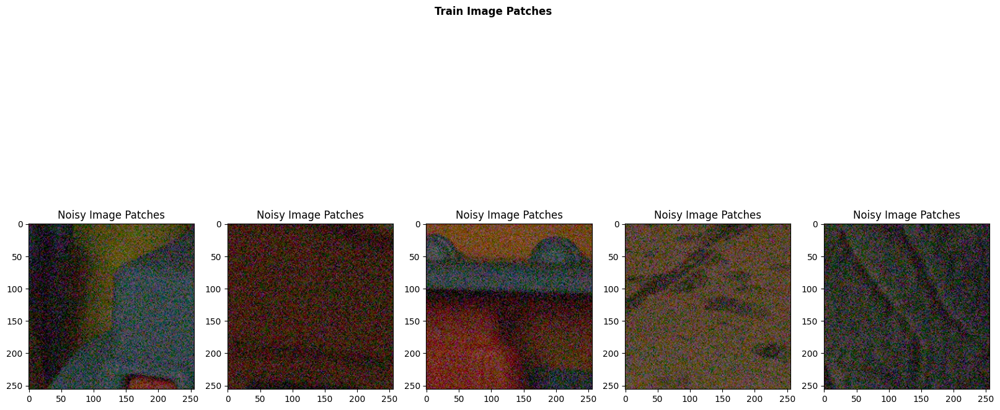

In [18]:
fig, axs = plt.subplots(1,5,figsize=(20,10))
r = random.sample(range(0, rows), 5)
c = random.sample(range(0, cols), 5)
fig.suptitle('Train Image Patches',fontweight ="bold")
for i in range(5):
  axs[i].imshow(patches_gt[r[i]][c[i]][0])
  axs[i].set_title('Ground Truth Image Patches')
  axs[i].imshow(patches_nsy[r[i]][c[i]][0])
  axs[i].set_title('Noisy Image Patches')

In [19]:
#Creating patches for X_train and y_train
X_train_patches = []
y_train_patches = []
for i in range(len(X_train)):
  path = X_train.iloc[i]
  img_nsy = cv2.imread(path)
  img_nsy = cv2.cvtColor(img_nsy, cv2.COLOR_BGR2RGB)
  img_nsy = cv2.resize(img_nsy,(1024,1024))  #resizing the X_train images
  patches_nsy = patches(img_nsy,256)
  
  path = y_train.iloc[i]
  img_gt = cv2.imread(path)
  img_gt = cv2.cvtColor(img_gt, cv2.COLOR_BGR2RGB)
  img_gt = cv2.resize(img_gt,(1024,1024))  #resizing the y_train images
  patches_gt = patches(img_gt,256)

  rows = patches_nsy.shape[0]
  cols = patches_nsy.shape[1]
  for j in range(rows):
    for k in range(cols):
      X_train_patches.append(patches_nsy[j][k][0])
      y_train_patches.append(patches_gt[j][k][0])
  
X_train = np.array(X_train_patches)
y_train = np.array(y_train_patches)

In [20]:
#Creating patches for X_test and y_test
X_test_patches = []
y_test_patches = []
for i in range(len(X_test)):
  path = X_test.iloc[i]
  img_nsy = cv2.imread(path)
  img_nsy = cv2.cvtColor(img_nsy, cv2.COLOR_BGR2RGB)
  img_nsy = cv2.resize(img_nsy,(1024,1024))  #resizing the X_test images
  patches_nsy = patches(img_nsy,256)
  
  path = y_test.iloc[i]
  img_gt = cv2.imread(path)
  img_gt = cv2.cvtColor(img_gt, cv2.COLOR_BGR2RGB)
  img_gt = cv2.resize(img_gt,(1024,1024))  #resizing the y_test images
  patches_gt = patches(img_gt,256)

  rows = patches_nsy.shape[0]
  cols = patches_nsy.shape[1]
  for j in range(rows):
    for k in range(cols):
      X_test_patches.append(patches_nsy[j][k][0])
      y_test_patches.append(patches_gt[j][k][0])

X_test = np.array(X_test_patches)
y_test = np.array(y_test_patches)

In [21]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(2048, 256, 256, 3)
(2048, 256, 256, 3)
(512, 256, 256, 3)
(512, 256, 256, 3)


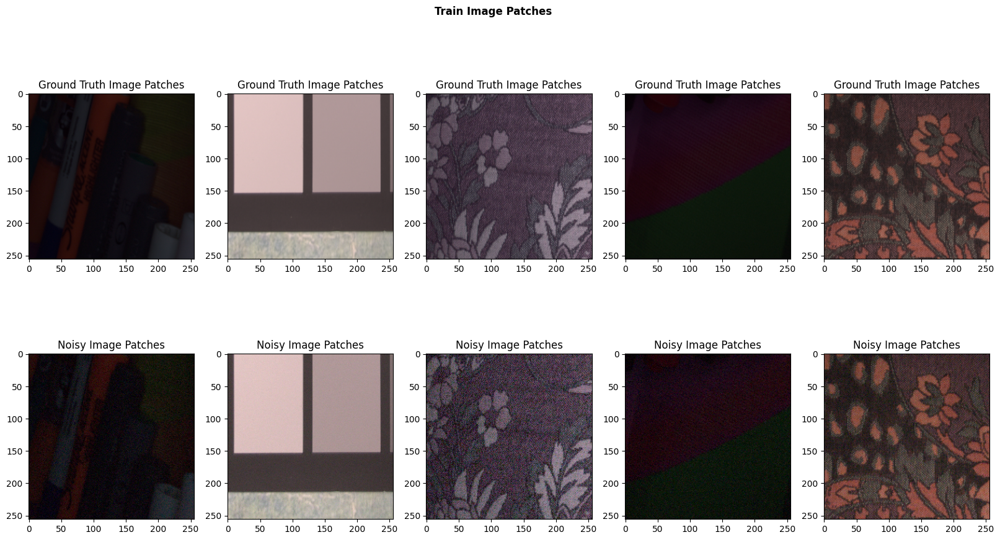

In [22]:
fig, axs = plt.subplots(2,5,figsize=(20,10))
r = random.sample(range(0,1600 ), 5)

fig.suptitle('Train Image Patches',fontweight ="bold")
for i in range(5):
  axs[0][i].imshow(y_train[r[i]])
  axs[0][i].set_title('Ground Truth Image Patches')
  axs[1][i].imshow(X_train[r[i]])
  axs[1][i].set_title('Noisy Image Patches')

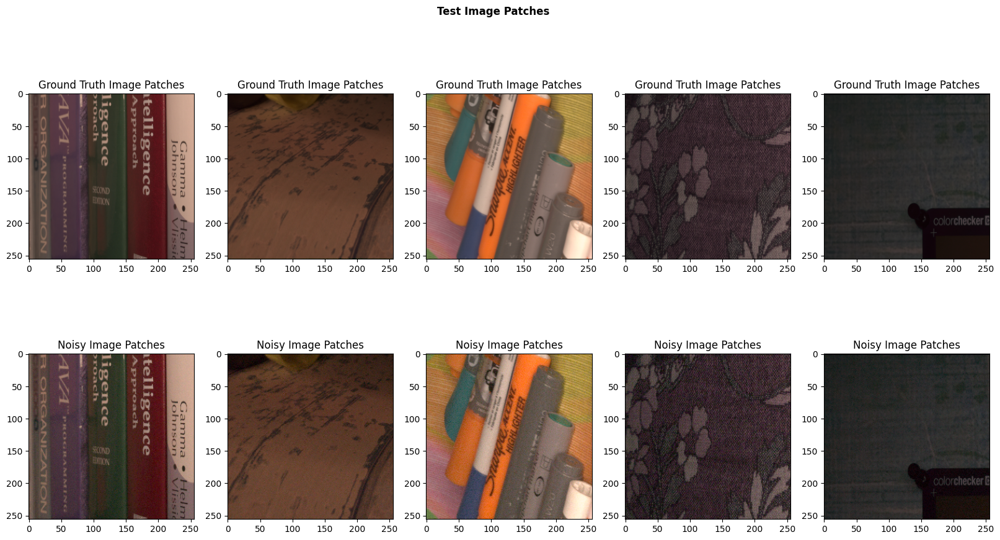

In [23]:
fig, axs = plt.subplots(2,5,figsize=(20,10))
r = random.sample(range(0, 500), 5)

fig.suptitle('Test Image Patches',fontweight ="bold")
for i in range(5):
  axs[0][i].imshow(y_test[r[i]])
  axs[0][i].set_title('Ground Truth Image Patches')
  axs[1][i].imshow(X_test[r[i]])
  axs[1][i].set_title('Noisy Image Patches')

In [24]:
print("Total number of image patches on train data : ", len(X_train))
print("Total number of image patches on test data : ", len(X_test))

Total number of image patches on train data :  2048
Total number of image patches on test data :  512


In [25]:
import pickle
pickle.dump((X_train,y_train),open('train_data.pkl','wb'))
pickle.dump((X_test,y_test),open('test_data.pkl','wb'))
     

In [26]:
with open('D:/train_data.pkl', 'wb') as f:
    pickle.dump((X_train,y_train), f)

# store test_data.pkl in D drive
with open('D:/test_data.pkl', 'wb') as f:
    pickle.dump((X_test,y_test), f)

In [27]:
X_train_patches, y_train_patches = pickle.load(open('D:/train_data.pkl', 'rb'))
X_test_patches,y_test_patches = pickle.load(open('D:/test_data.pkl', 'rb'))

In [28]:
print(X_train_patches.shape)
print(y_train_patches.shape)
print(X_test_patches.shape)
print(y_test_patches.shape)

(2048, 256, 256, 3)
(2048, 256, 256, 3)
(512, 256, 256, 3)
(512, 256, 256, 3)


In [29]:
#Normalizing the image pixels
X_train_patches = X_train_patches.astype("float32") / 255.0
y_train_patches = y_train_patches.astype("float32") / 255.0
X_test_patches = X_test_patches.astype("float32") / 255.0
y_test_patches = y_test_patches.astype("float32") / 255.0

In [30]:
class Dataloder(tf.keras.utils.Sequence):    
    def __init__(self, X,y,batch_size=1, shuffle=False):
        self.X = X
        self.y = y
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.indexes = np.arange(len(X))

    def __getitem__(self, i):
        # collect batch data
        batch_x = self.X[i * self.batch_size : (i+1) * self.batch_size]
        batch_y = self.y[i * self.batch_size : (i+1) * self.batch_size]
        
        return tuple((batch_x,batch_y))
    
    def __len__(self):
        return len(self.indexes) // self.batch_size
    
    def on_epoch_end(self):
        if self.shuffle:
            self.indexes = np.random.permutation(self.indexes)

In [31]:
batch_size=32
train_dataloader = Dataloder(X_train_patches,y_train_patches, batch_size, shuffle=True)
test_dataloader = Dataloder(X_test_patches,y_test_patches,batch_size, shuffle=True)
     

In [32]:
train_dataloader[0][0].shape

(32, 256, 256, 3)

In [33]:
class EAM(tf.keras.layers.Layer):
  def __init__(self,**kwargs):
    super().__init__(**kwargs)
    
    self.conv1 = Conv2D(64, (3,3), dilation_rate=1,padding='same',activation='relu')
    self.conv2 = Conv2D(64, (3,3), dilation_rate=2,padding='same',activation='relu') 

    self.conv3 = Conv2D(64, (3,3), dilation_rate=3,padding='same',activation='relu')
    self.conv4 = Conv2D(64, (3,3), dilation_rate=4,padding='same',activation='relu')

    self.conv5 = Conv2D(64, (3,3),padding='same',activation='relu')

    self.conv6 = Conv2D(64, (3,3),padding='same',activation='relu')
    self.conv7 = Conv2D(64, (3,3),padding='same')

    self.conv8 = Conv2D(64, (3,3),padding='same',activation='relu')
    self.conv9 = Conv2D(64, (3,3),padding='same',activation='relu')
    self.conv10 = Conv2D(64, (1,1),padding='same')

    self.gap = GlobalAveragePooling2D()

    self.conv11 = Conv2D(64, (3,3),padding='same',activation='relu')
    self.conv12 = Conv2D(64, (3,3),padding='same',activation='sigmoid')

  def call(self,input):
    conv1 = self.conv1(input)
    conv1 = self.conv2(conv1)

    conv2 = self.conv3(input)
    conv2 = self.conv4(conv2)

    concat = concatenate([conv1,conv2])
    conv3 = self.conv5(concat)
    add1 = Add()([input,conv3])

    conv4 = self.conv6(add1)
    conv4 = self.conv7(conv4)
    add2 = Add()([conv4,add1])
    add2 = Activation('relu')(add2)

    conv5 = self.conv8(add2)
    conv5 = self.conv9(conv5)
    conv5 = self.conv10(conv5)
    add3 = Add()([add2,conv5])
    add3 = Activation('relu')(add3)

    gap = self.gap(add3)
    gap = Reshape((1,1,64))(gap)
    conv6 = self.conv11(gap)
    conv6 = self.conv12(conv6)
    
    mul = Multiply()([conv6, add3])
    out = Add()([input,mul]) # This is not included in the reference code
    return out
     

In [34]:
tf.keras.backend.clear_session()
input = Input(shape=(256, 256, 3))

conv1 = Conv2D(64, (3,3),padding='same')(input)
eam1 = EAM()(conv1)
eam2 = EAM()(eam1)
eam3 = EAM()(eam2)
eam4 = EAM()(eam3)
#add = Add()([eam4,conv1])  
conv2 = Conv2D(3, (3,3),padding='same')(eam4)
out = Add()([conv2,input])

RIDNet = Model(input,out)
RIDNet.compile(optimizer=tf.keras.optimizers.Adam(1e-03), loss=tf.keras.losses.MeanSquaredError())
RIDNet.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 256, 256, 64)         1792      ['input_1[0][0]']             
                                                                                                  
 eam (EAM)                   (None, 256, 256, 64)         447232    ['conv2d[0][0]']              
                                                                                                  
 eam_1 (EAM)                 (None, 256, 256, 64)         447232    ['eam[0][0]']                 
                                                                                              

In [35]:
batch_size=8
train_dataloader = Dataloder(X_train_patches,y_train_patches, batch_size, shuffle=True)
test_dataloader = Dataloder(X_test_patches,y_test_patches,batch_size, shuffle=True)

In [36]:
from tensorflow.python.client import device_lib

def get_available_devices():
    local_device_protos = device_lib.list_local_devices()
    return [x.name for x in local_device_protos]

print(get_available_devices())

['/device:CPU:0']


In [ ]:
log_dir="logs/model_4"
tensorboard = tf.keras.callbacks.TensorBoard(log_dir=log_dir,histogram_freq=1, write_graph=True,write_grads=True)
reducelr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1,verbose=1,patience=4,min_delta=0.00001)
callback = [tensorboard,reducelr]
RIDNet.fit(train_dataloader,shuffle=True,epochs=20,validation_data= test_dataloader, callbacks=callback)

Epoch 1/20
 17/256 [>.............................] - ETA: 1:48:03 - loss: 0.3045

In [ ]:
from keras.models import load_model
model = load_model('RIDNet.h5')